<a href="https://colab.research.google.com/github/Seekcha/AddingSearchingUpdateViewUsingXMLAndPhp/blob/master/Custom_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)





---


## To run code on GPU
To run the code on GPU, click [CUDA-GPU](https://colab.research.google.com/github/ShimaaElabd/CUDA-GPU-Contrast-Enhancement/blob/master/CUDA_GPU.ipynb#scrollTo=h7lbKJvm-SLG).

# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 9833, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 9833 (delta 1), reused 2 (delta 0), pack-reused 9822
Receiving objects: 100% (9833/9833), 10.15 MiB | 23.73 MiB/s, done.
Resolving deltas: 100% (6823/6823), done.
/content/yolov5
     |████████████████████████████████| 596 kB 4.1 MB/s 
     |████████████████████████████████| 178 kB 4.1 MB/s 
     |████████████████████████████████| 1.1 MB 60.0 MB/s 
     |████████████████████████████████| 138 kB 78.2 MB/s 
     |████████████████████████████████| 62 kB 1.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompati

# Step 2: Label the dataset

In order to train the custom model, we need to label our dataset using  [MakeSense](https://www.makesense.ai/): an online tool to label your work. And we need our dataset to be in YOLOv5 format.

Since I already label the dataset. You can execute the following line to clone the GitHub.

In [2]:
#clone Dataset 
!git clone https://github.com/Seekcha/datasets.git

Cloning into 'datasets'...
remote: Enumerating objects: 593, done.
remote: Counting objects: 100% (593/593), done.
remote: Compressing objects: 100% (580/580), done.
remote: Total 593 (delta 13), reused 592 (delta 12), pack-reused 0
Receiving objects: 100% (593/593), 3.59 MiB | 3.82 MiB/s, done.
Resolving deltas: 100% (13/13), done.


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/yolov5/datasets"

# Step 3: Add Classes

You can now replace the file **coco.yaml** by following directory *Yolov5 > data*.


In [ ]:
train: ../yolov5/datasets/train/images
val: ../yolov5/datasets/valid/images

nc: 2
names: ['fish', 'pellet']

# Step 4: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [4]:
!python train.py --img 416 --batch 59 --epochs 3000 --data coco.yaml --weights yolov5s.pt --cache --device 0

Streaming output truncated to the last 5000 lines.

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1002/2999      6.1G   0.03704   0.03859 0.0003385      1623       416: 100% 7/7 [00:03<00:00,  1.82it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 1/1 [00:00<00:00,  1.91it/s]
                 all        111       2056      0.911      0.818      0.855      0.553

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1003/2999      6.1G     0.038   0.03802 0.0003063      1637       416: 100% 7/7 [00:03<00:00,  1.82it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 1/1 [00:00<00:00,  1.96it/s]
                 all        111       2056      0.915      0.815      0.853      0.553

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 1004/2999      6.1G   0.03776   0.03994 0.0002806      2039       416: 100% 7/7 [00:03<00:00,  1.81it/

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [5]:
#clone Dataset 
!git clone https://github.com/Seekcha/customPelletModel.git
!unzip /content/yolov5/customPelletModel/best.zip 

Cloning into 'customPelletModel'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 6 (delta 0), reused 6 (delta 0), pack-reused 0
Unpacking objects: 100% (6/6), done.
Archive:  /content/yolov5/customPelletModel/best.zip
  inflating: best.pt                 


Download the pictures for prediction

In [41]:
!git clone https://github.com/Seekcha/input.git

Cloning into 'input'...
remote: Enumerating objects: 20, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 20 (delta 0), reused 20 (delta 0), pack-reused 0
Unpacking objects: 100% (20/20), done.


In [51]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/input/3.png
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.3 --source /content/yolov5/input/1.png
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.7 --source /content/yolov5/input/new9.mp4


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/input/3.png, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-37-g620b535 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/input/3.png: 416x320 6 fishs, Done. (0.011s)
Speed: 0.3ms pre-process, 10.8ms inference, 1.5ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp
detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/input/1.png, imgsz=[416, 416], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_tx

Display inference on ALL test images.

First image detection




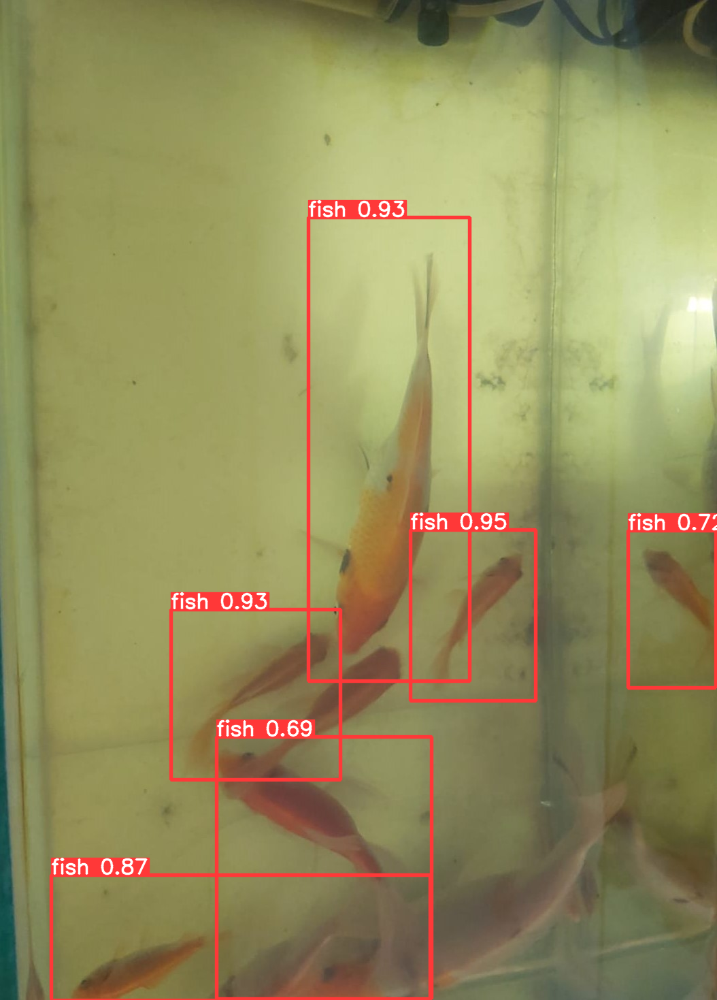



Second image detection




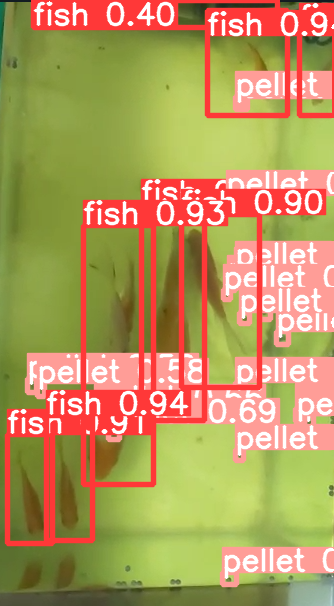

In [50]:
# 4/1AX4XfWg-qIGtCf7tgejnrDTYQZOvvP1ax4db-E0qVW6v2lO9csarxW9Kemk

import glob
from IPython.display import Image, display

print("First image detection")
print("\n")
for imageName1 in glob.glob('/content/yolov5/runs/detect/exp/3.png'): 
    display(Image(filename=imageName1))
    print("\n")


print("Second image detection")
print("\n")
for imageName2 in glob.glob('/content/yolov5/runs/detect/exp2/1.png'): 
    display(Image(filename=imageName2))
    print("\n")



# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>